# Исследование ресторанного бизнеса в Москве

**Цель исследования**
1. Подготовить исследование рынка Москвы
2. Найти интересные особенности
3. Презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Исследование состоит из следующих этапов:**
1. Обзор данных
2. Предобработка данных
3. Расчеты и добавление результатов в таблицу
4. Проведение анализа данных
5. Визуализация данных
6. Детализация исследования: открытие кофейни
7. Написание общего вывода
8. Подготовка презентации

## Загрузить данные и изучить общую информацию


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
from scipy import stats
from numpy import median
import json
import folium
from folium import Map, Choropleth

In [2]:
try:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
except:
    data = pd.read_csv('moscow_places.csv')

In [3]:
data.info()
data.head(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Типы данных выгружены корректно, пропусков не обнаружено.

##  Выполнить предобработку данных

### Изучим, есть ли дубликаты в данных. Поищем пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

In [4]:
data['name'] = data['name'].str.lower()

Можно через drop_duplicates удалить один из дубликатов, оставив только первый

In [5]:
data.drop_duplicates(subset=['name', 'address'], keep='first')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [6]:
print('Duplicate rows in the dataset: {}'.format(data.duplicated().sum()))
print('Duplicate object id: {}\n'.format(len(data)-len(data['name'].value_counts())))
print('Check the correctness of object types:\n{}'.format(data['category'].value_counts()))

Duplicate rows in the dataset: 0
Duplicate object id: 2894

Check the correctness of object types:
кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64


Обратим внимание на то, что у одной сети могут быть разные названия объектов. Пока не понятно надо ли нам что-то с этим делать и помешает ли нам это в анализе. Но могут ошибочно заведения сети быть указаны несетевыми. Вопрос к людям, которые предоставили нам выгрузку на сколько мы можем доверять указанным данным?

Можем поискать данные самостоятельно, и быть более уверенными в результатах анализа. Но делать этого в данном проекте не будем, так как предположим, что данные тут указаны верно.

Подготовка к анализу завершена.

Cделаем меньшее количество условий, и отработаем все условия по выбросам раздельно и результат фильтрации запишем не в первоначальный датафрейм, а для каждого условия сделаем отдельный датафрейм, по которому далее и будем строить графики.

Например, если убираем выбросы по средней стоимости чашки кофе и строим график по этим данным, создадим переменную clean_coffee:

In [7]:
coffee_1 = data['middle_coffee_cup'].quantile(0.01)
coffee_99 = data['middle_coffee_cup'].quantile(0.99)
clean_coffee = data.query('middle_coffee_cup < @coffee_99 and middle_coffee_cup > @coffee_1')
display(clean_coffee.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
72,лакрица,кофейня,"Москва, Алтуфьевское шоссе, 85",Северо-Восточный административный округ,"ежедневно, 08:00–21:00",55.891196,37.585653,4.5,средние,Цена чашки капучино:150–190 ₽,NaN,170.0,0,12.0
81,coffee way,кофейня,"Москва, Алтуфьевское шоссе, 86, корп. 1",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.897789,37.588189,4.3,NaN,Цена чашки капучино:120–170 ₽,NaN,145.0,1,120.0
89,сахарочек,кофейня,"Москва, Дмитровское шоссе, 107А, корп. 2",Северный административный округ,пн-пт 09:00–22:00; сб 10:00–22:00; вс 10:00–21:00,55.879256,37.538444,4.5,средние,Цена чашки капучино:100–200 ₽,NaN,150.0,0,120.0
100,take and wake,кофейня,"Москва, Дмитровское шоссе, 100, стр. 2",Северный административный округ,пн-пт 08:30–18:30,55.882019,37.546174,4.5,низкие,Цена чашки капучино:150–210 ₽,NaN,180.0,1,120.0


### Создадим столбец street с названиями улиц из столбца с адресом.

Создадим новый столбец street: в нем будет список из улицы и номера дома. Объединим эти два элемента при формировании столбца: 

In [8]:
data['street'] = data['address'].apply(lambda x: x.split(', ')[1])

### Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
логическое значение True — если заведение работает ежедневно и круглосуточно;
логическое значение False — в противоположном случае.

In [9]:
data['is_24/7'] = (
(data['hours'].str.contains('круглосуточно') == True) &  (data['hours'].str.contains('ежедневно') == True)
)

In [10]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


Посмотрим какое количество заведений, в которых число посадочных мест в разбивке по категориям превышает   95-й перцентиль:

In [11]:
count_95 = 0
for name in data['category'].unique():
    count_95 += (data[data['category'] == name]['seats'] > round(float(np.nanpercentile(data[data['category'] == name]['seats'], [95])),2)).sum()
print('Количество заведений, в которых число посадочных мест в разбивке по категориям превышает 95-й перцентиль:',count_95)

Количество заведений, в которых число посадочных мест в разбивке по категориям превышает 95-й перцентиль: 226


Заменим на NaN значения, превышающие 95 перцентиль количества мест в заведении по каждой категории. Для замены значений используем векторный подход к данным.

In [12]:
for name in data['category'].unique():
    data.loc[(data['category']==name) & (data['seats'] > round(float(np.nanpercentile(data[data['category'] == name]['seats'], [95])),2)), 'seats'] = np.nan

In [13]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


Выполнена предобработка данных, данные изучены. Добавлены 2 новых столбца: street, is_24/7. Подготовка к анализу завершена.

## Анализ данных

### Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. 
Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [14]:
category_type = data.groupby('category')['name'].count().sort_values(ascending=False).reset_index()
category_type

,category,name
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [15]:
fig = px.bar(category_type, x='category', y='name')
fig.update_layout(title='Количество заведений по категориям',
                   xaxis_title='Категория заведений',
                   yaxis_title='Количество')
fig.show()

Больше всего кафе - 2378, ресторанов - 2043, кофеен - 1413. Меньше всего булочных - 256.

In [16]:
df_category = data.groupby(['category', 'chain']).agg(v=('category', 'count')).sort_values(by='v', ascending=False).reset_index(level=1)
df_category['chain'] = df_category['chain'].astype(str)
fig = px.bar(df_category, x=df_category.index, y='v', color='chain')
fig.update_layout(title='Количество сетевых и не сетевых заведений по категориям',
                   xaxis_title='Категория заведений',
                   yaxis_title='Количество')
fig.show()

chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
- 0 — заведение не является сетевым
- 1 — заведение является сетевым

Видно, что больше несетевых кафе (1599 против 779) и ресторанов (1313 против 730). А вот кофеен чуть больше сетевых (720, против 693 несетевых). А среди булочных - больше сетевых (157 против 99 несетевых).

### Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. 
Построим визуализации. 

Для расчёта  количества посадочных мест для каждого вида объекта общественного питания необходимо сгруппировать датасет по всем видам заведений и рассчитать медианное значение количества посадочных мест для каждого вида заведений.

In [17]:
# формируем таблицу с медианным количеством посадочных мест для каждого вида объекта питания
mean_seat_data = data.groupby('category').agg({'seats':'median'}).sort_values(by='seats', ascending=False).reset_index()
mean_seat_data['seats'] = round(mean_seat_data['seats'], 1) 

mean_seat_data.columns = ['Вид объекта', 'Медианное количество посадочных мест']
display(mean_seat_data)

,Вид объекта,Медианное количество посадочных мест
0,"бар,паб",80.0
1,ресторан,80.0
2,кофейня,70.0
3,столовая,70.0
4,быстрое питание,60.0
5,кафе,55.5
6,пиццерия,50.0
7,булочная,48.0


В топе бары, пабы и рестораны: медианное количество посадочных мест 80. Посмотрим, что со средними значениями.  

In [18]:
# формируем таблицу со средним количеством посадочных мест для каждого вида объекта питания
mean_seat_data = data.groupby('category').agg({'seats':'mean'}).sort_values(by='seats', ascending=False).reset_index()
mean_seat_data['seats'] = round(mean_seat_data['seats'], 1) 

mean_seat_data.columns = ['Вид объекта', 'Среднее количество посадочных мест']
display(mean_seat_data)

,Вид объекта,Среднее количество посадочных мест
0,ресторан,101.7
1,"бар,паб",99.0
2,кофейня,92.8
3,быстрое питание,85.1
4,столовая,78.6
5,кафе,78.4
6,пиццерия,76.8
7,булочная,75.1


А вот среди брать средние значения, в топе рестораны - 101,7 мест, бар,пабы - 99, кофейни - 92,8. Медианное значение взять правильнее, по ним и построим график для наглядности.

[Text(0.5, 1.0, 'Медианное количество посадочных мест по категориям')]

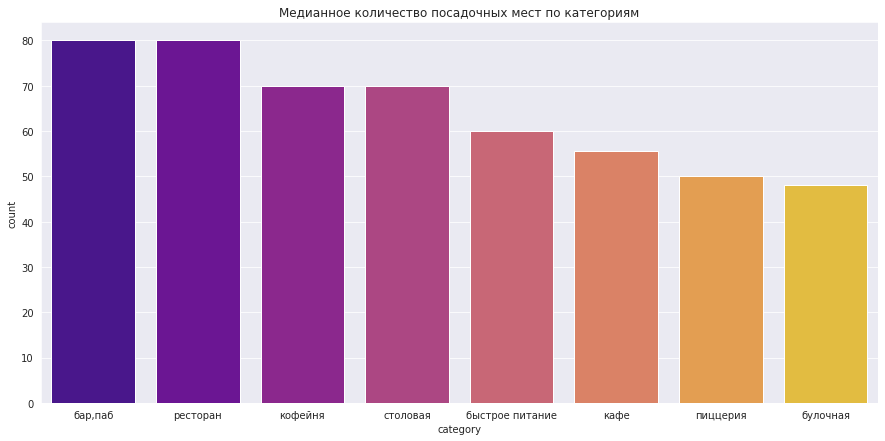

In [19]:
seats_list = (
    data
    .groupby('category').agg(count=('seats', 'median'))
    .reset_index()
    .sort_values(by='count', ascending=False)
)
seats_list

plt.figure(figsize=(15,7))
sns.set_style('darkgrid')
sns.barplot(data=seats_list, x="category", y="count", palette='plasma').set(title='Медианное количество посадочных мест по категориям')

Из графика видно, что топ бары, пабы, рестораны по количеству мест. 

### Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [20]:
chain = data.pivot_table(index = 'chain', values='name', aggfunc='count').reset_index()
fig = go.Figure(data=go.Pie(labels=chain['chain'], values=chain['name']))
fig.update_layout(title='Cоотношение сетевых и не сетевых заведений')
fig.show()

61,9% заведений (5201) - не сетевые. 38,1% заведений (3205) - сетевые.

### Какие категории заведений чаще являются сетевыми?
Исследуем данные и ответим на вопрос графиком.

Для определения наиболее распространённых видов сетевых объектов питания необходимо рассчитать какую долю занимают сетевые объекты от общего количества объектов для каждого вида.

[Text(0.5, 1.0, 'Количество сетевых заведений по категориям')]

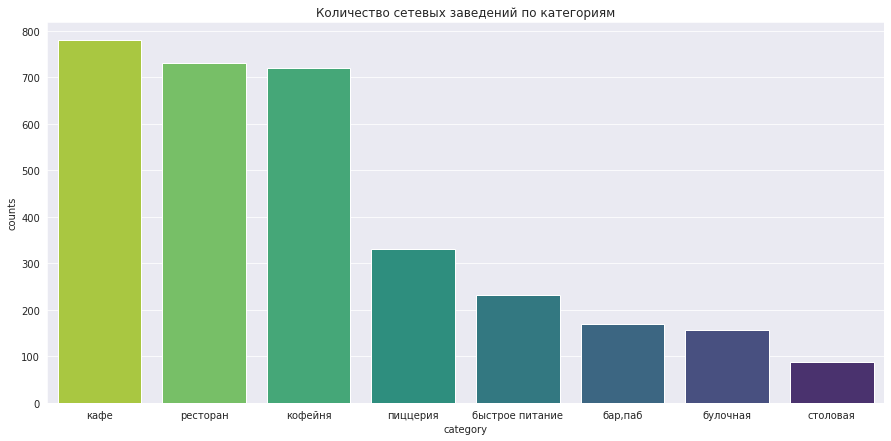

In [21]:
# группирем объекты питания по сетевой принадлежности и виду объекта и считаем их количество
chain_list = (
    data
    .groupby(['chain', 'category']).agg(counts=('name','count'))
    .reset_index()
    .sort_values(by='counts', ascending=False)
    .query('chain == 1')
)
chain_list

plt.figure(figsize=(15,7))
sns.set_style('darkgrid')
sns.barplot(data=chain_list, x="category", y="counts", palette='viridis_r').set(title='Количество сетевых заведений по категориям')

In [22]:
import plotly.express as px
fig = px.pie(chain_list, values='counts', names='category',
             color ='category')
fig.update_traces(textposition='inside',
                  textinfo='percent+label',
                  sort=False)
fig.update_layout(title ='Количество сетевых заведений по категориям', width=1000, height=550)
fig.show()

Кафе, рестораны и кофейни чаще являются сетевыми: 779, 730 и 720 соответственно.  Они занимают 69,6% от всех категорий сетевых заведений.

### Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. 
Под популярностью понимается количество заведений этой сети в регионе. Построим подходящую для такой информации визуализацию. Знакомы ли нам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

Для построения данного графика требуется собрать сводную таблицу с количеством заведений каждой сети. 

In [23]:
top_15_name = data[data['chain'] == 1].groupby('name').agg(quantity=('name', 'count')).sort_values(by='quantity', ascending=False).reset_index().head(15)

# строим столбчатую диаграмму 
fig = px.bar(top_15_name, # загружаем данные и заново их сортируем
             x='name', # указываем столбец с данными для оси X
             y='quantity', # указываем столбец с данными для оси Y 
             text='quantity' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='ТОП-15 популярных сетей по названиям заведений',
                   xaxis_title='Название заведения',
                   yaxis_title='Количество')
fig.show() # выводим график

В топе сетевых заведений Шоколадница - 120 заведений. Затем идет Доминос пицца - 76, Додо пицца - 74, из кофеен One price coffee - 71 и cofix - 65.

### Какие административные районы Москвы присутствуют в датасете? Отобразим общее количество заведений и количество заведений каждой категории по районам. 
Проиллюстрируем эту информацию одним графиком.

In [24]:
# соберем данные по району и категории в сводную таблицу
category_district = (
    data.pivot_table(index=['district', 'category'], values='name', aggfunc = 'count')
      .reset_index()
      .sort_values(by='name', ascending=False)
      .rename(columns={'name': 'quantity'})
)

fig = px.bar(category_district, 
            x='quantity',
            y='district', 
            color='category',
            text='quantity'
           )
fig.update_layout(title='Распределение заведений Москвы по округам и категориям',
                  xaxis_title='Количество заведений',
                  yaxis_title='Округ',
                  yaxis={'categoryorder': 'total ascending'},
                  width=950, height=500)
fig.show()

В ЦАО больше всего заведений: в топе рестораны 670, кафе 464, кофейни 428. Затем идет САО, ЮАО. Меньше всего заведений в СЗАО.

### Визуализируем распределение средних рейтингов по категориям заведений. 
Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [25]:
rating_list = data.groupby('category', as_index=False)['rating'].agg(lambda x: round(x.mean(), 2)).sort_values(by='rating', ascending=False)
rating_list

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


In [26]:
# строим столбчатую диаграмму 
fig = px.bar(rating_list, # загружаем данные и заново их сортируем
             x='category', # указываем столбец с данными для оси X
             y='rating', # указываем столбец с данными для оси Y 
             text='rating' # добавляем аргумент, который отобразит текст с информацией
                                        # о количестве объявлений внутри столбца графика
            )

# оформляем график
fig.update_layout(title='Средний рейтинг по категориям заведений',
                   xaxis_title='Категория заведений',
                   yaxis_title='Средний рейтинг',
                   width=800, height=400)

fig.show() # выводим график

Средний рейтинг выше у баров, пабов - 4,39. Затем идут пиццерии и рестораны - 4,3 и 4,29. Самый низкий у заведений быстрого питания - 4,05.

### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 
Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson

In [27]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
cp = folium.Choropleth(
    geo_data=state_geo,
    data=data.groupby('district', as_index = False)['rating'].agg('mean'),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.6,
    legend_name='Средний рейтинг заведений по районам').add_to(m)

for i in range(len(cp.geojson.data['features'])):
    name = cp.geojson.data['features'][i]['properties']['name']
    cp.geojson.data['features'][i]['properties']['rating'] = data.groupby('district')['rating'].agg(lambda x: round(x.mean(), 2))[name]
        
folium.GeoJsonTooltip(['name', 'rating'],aliases=['Округ', 'Рейтинг']).add_to(cp.geojson)
# выводим карту
m

Самый высокий средний рейтинг заведений в ЦАО - 4,38. Затем идет САО - 4,24 и СЗАО - 4,21. Самый низкий в ЮВАО и СВАО - 4,1 и 4,15.

### Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [28]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### Найдем топ-15 улиц по количеству заведений. 
Построим график распределения количества заведений и их категорий по этим улицам. Проиллюстрируем эту информацию одним графиком.

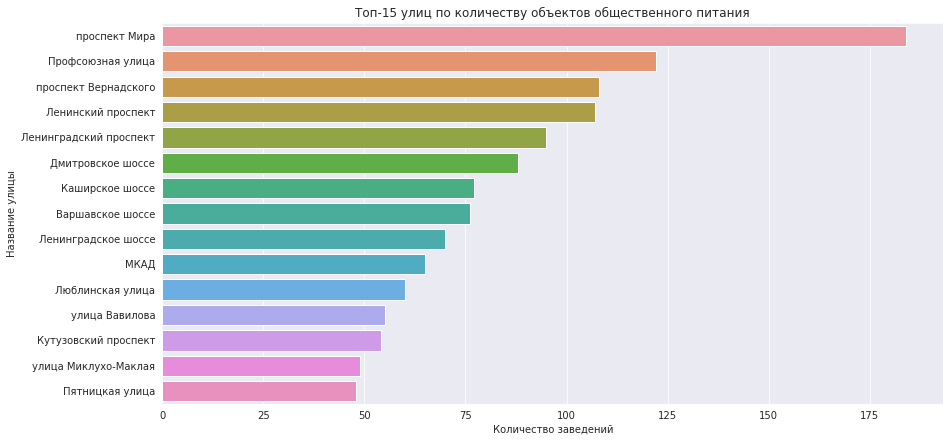

,Улица,Количество объектов
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [29]:
# создадим датафрейм: топ-15 улиц по количеству объектов общественного питания
top15_streets_object = data.groupby('street').agg({'name':'count'}).reset_index().sort_values(by='name', ascending=False).head(15)
top15_streets_object.columns = ['Улица', 'Количество объектов'] # Заменим названия столбцов

# график топ-15 улиц по количеству объектов общественного питания
plt.figure(figsize=(14, 7))
plt.title('Топ-15 улиц по количеству объектов общественного питания') 
sns.barplot(x='Количество объектов', y='Улица', data=top15_streets_object).set(ylabel='Название улицы', xlabel='Количество заведений')
plt.show()

display(top15_streets_object) 

Больше всего заведений на проспекте Мира - 184. Затем идет Профсоюзная улица (ее длина 10 км) - 122, проспект Вернадского - 108, Ленинский проспект - 107. Дмитровское, Каширское, Варшавское (22,5 км), Ленинградское шоссе (15,2 км) - тоже в Топ, видимо из-за протяженностей этих шоссе заведений тут больше. (Средняя длина улиц в Москве — 934 метра. Подробности: https://regnum.ru/news/cultura/3027371.html)

In [30]:
top_15_streets = data.groupby(['street']).agg(cnt_venues_on_street=('name', 'count')).sort_values(by='cnt_venues_on_street', ascending=False).reset_index().head(15)
street_category = data.groupby(['street', 'category']).agg(cnt_venues_by_category_on_street=('name', 'count')).reset_index()
top_15_streets = top_15_streets.merge(street_category, on='street', how='left')

display(top_15_streets)

,street,cnt_venues_on_street,category,cnt_venues_by_category_on_street
0,проспект Мира,184,"бар,паб",12
1,проспект Мира,184,булочная,4
2,проспект Мира,184,быстрое питание,21
3,проспект Мира,184,кафе,53
4,проспект Мира,184,кофейня,36
...,...,...,...,...
106,Пятницкая улица,48,быстрое питание,2
107,Пятницкая улица,48,кафе,7
108,Пятницкая улица,48,кофейня,6
109,Пятницкая улица,48,пиццерия,3


In [31]:
fig = px.bar(top_15_streets, 
            x='cnt_venues_on_street',
            y='street', 
            color='category',
            text='cnt_venues_by_category_on_street'
           )
fig.update_layout(title='Топ-15 улиц по количеству заведений и категориям',
                  xaxis_title='Количество заведений',
                  yaxis_title='Улица',
                  yaxis={'categoryorder': 'total ascending'})
fig.show()

На проспекте Мира целых 53 кафе, 36 кофеен и 21 зааведений быстрого питания. Видно, что меньше всего столовых и булочных на этих улицах.

### Найдем улицы, на которых находится только один объект общепита. 
Что можно сказать об этих заведениях?

In [32]:
data['street'].nunique ()

1448

Для выявления улиц, на которых располагается только один объект общественного питания, необходимо сгруппировать датасет по названию улицы и посчитать количество объектов для каждой улицы. После этого необходимо применить фильтрацию и выбрать только те улицы, на которые приходится только 1 объект общественного питания.

In [33]:
all_streets = data.groupby(['street']).agg(cnt_venues_on_street=('name', 'count')).sort_values(by='cnt_venues_on_street', ascending=False).reset_index()
street_category = data.groupby(['street', 'category']).agg(cnt_venues_by_category_on_street=('name', 'count')).reset_index()
all_streets = all_streets.merge(street_category, on='street', how='left')
display(all_streets.query('cnt_venues_on_street == 1'))

,street,cnt_venues_on_street,category,cnt_venues_by_category_on_street
3364,улица Фотиевой,1,столовая,1
3365,улица Фадеева,1,кофейня,1
3366,улица Кирпичные Выемки,1,кафе,1
3367,сад Эрмитаж,1,быстрое питание,1
3368,улица Ивана Франко,1,ресторан,1
...,...,...,...,...
3817,Павелецкая набережная,1,кофейня,1
3818,Панкратьевский переулок,1,столовая,1
3819,Парусный проезд,1,ресторан,1
3820,Певческий переулок,1,ресторан,1


458 улиц с одним заведением. Всего 1448 улиц, получаем 31,6%. Более на 72% улиц более одного заведения.

В центре тоже есть такие улицы, это может быть связано с тем, что улицы короткие.

### Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. 
Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

Возьмём информацию по среднему чеку и найдем медианное значение для каждого округа, из такой таблицы будет видно, как различаются цены в различных округах.

In [34]:
median_bill = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median').sort_values(by='middle_avg_bill', ascending=False)
median_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [35]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
cp = folium.Choropleth(
    geo_data=state_geo,
    data=data.groupby('district', as_index = False)['middle_avg_bill'].agg('median'),
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.6,
    legend_name='Медианный чек заведений по районам').add_to(m)
m

В ЦАО и ЗАО самый большой средний чек - 1000р. Самый маленький в СВАО, ЮАО и ЮВАО - 500, 500 и 450р.

### Распределение заведений в разрезе категорий по округам

In [36]:
data_ratio = (data.groupby(['district', 'category'], as_index=False)
                     .agg(count_object=('name', 'count')))

data_ratio['sum_object'] = data_ratio.groupby('district')['count_object'].transform(sum)
data_ratio['ratio'] = round(data_ratio['count_object'] / data_ratio['sum_object'], 3)
data_ratio.head(10)

,district,category,count_object,sum_object,ratio
0,Восточный административный округ,"бар,паб",53,798,0.066
1,Восточный административный округ,булочная,25,798,0.031
2,Восточный административный округ,быстрое питание,71,798,0.089
3,Восточный административный округ,кафе,272,798,0.341
4,Восточный административный округ,кофейня,105,798,0.132
5,Восточный административный округ,пиццерия,72,798,0.090
6,Восточный административный округ,ресторан,160,798,0.201
7,Восточный административный округ,столовая,40,798,0.050
8,Западный административный округ,"бар,паб",50,851,0.059
9,Западный административный округ,булочная,37,851,0.043


In [37]:
fig = px.bar(data_ratio,
            x='ratio',
            y='district',
            color='category',
            title='Распределение заведений в разрезе категорий по округам',
            text=round(data_ratio['ratio']*100, 2)
            )

fig.update_layout(
    yaxis_title='Район',
    xaxis_title='%',
    yaxis=dict(
        tickmode='array',
        tickvals=data_ratio['district'],
        ticktext=data_ratio['district']
    ),
    legend_title='Категории заведений',
    autosize=False,
    width=1200, height=500
)

fig.show()

Из графика видно, что больше всего кафе, особенно в ЮВАО (39,5%), ВАО (34,1%) и ЮЗАО (33,6%) из всех заведений в этих округах.

В ЦАО баров и пабов в процентном соотношении больше, чем в других округах - 16,2%. Как и ресторанов - 29,9%. 

Наибольший процент коффеен среди других заведений (по сравнению с другими округами) больше в САО - 21,4%, ЦАО - 19,1%, СВАО - 17,8%, ЗАО - 17,6%. Меньше всего в ЮВАО и ВАО - 12,5% и 13,2%. 

### Соотношения среднего чека у сетевых и несетевых заведений

In [38]:
#создадим датафрейм 
data_bill_category = (data.groupby(['chain', 'category'], as_index=False)
                      .agg(middle_avg_bill=('middle_avg_bill', 'median'))
                      .pivot(index='chain', columns='category', values='middle_avg_bill')
                      .reset_index()
                      .drop(columns=['chain']))
data_bill_category

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,1250.0,425.0,350.0,550.0,381.0,850.0,1250.0,300.0
1,1060.0,550.0,425.0,550.0,575.0,500.0,1000.0,300.0


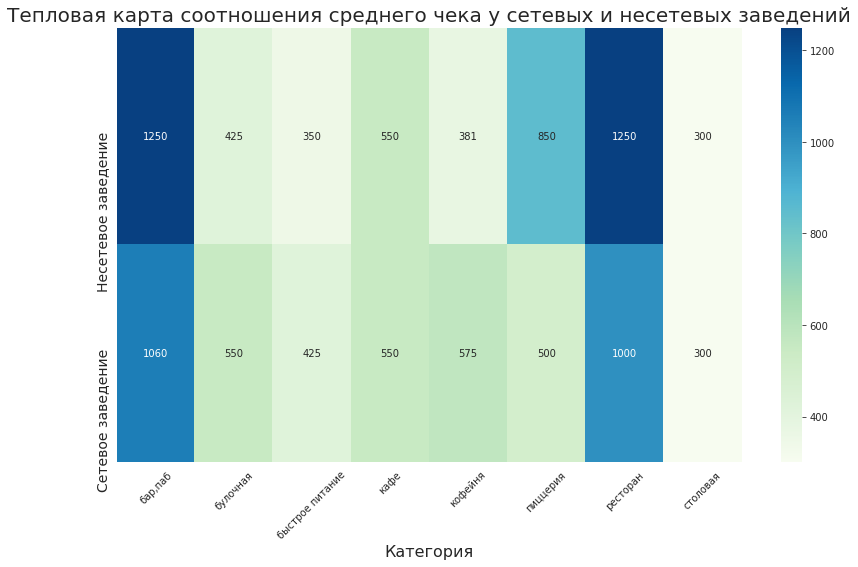

In [39]:
#построим тепловую карту
plt.figure(figsize = (14, 8))
ax = sns.heatmap(data_bill_category, annot=True, fmt='g', cmap='GnBu')
ax.set_title('Тепловая карта соотношения среднего чека у сетевых и несетевых заведений', fontsize=20)
ax.set_xlabel('Категория', fontsize=16)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
ax.set_yticklabels(['Несетевое заведение', 'Сетевое заведение'], fontsize=14)
plt.show()

Из графика можно заметить, что медианное значение среднего чека у несетевых заведений выше в барах, пабах - 1250, ресторанах - 1250, пиццериях - 850р. А самый низкий в несетевых быстрого питания - 350р, в сетевых - 425р.

###  Общий вывод

- Больше несетевых кафе (1599 против 779) и ресторанов (1313 против 730). А вот кофеен чуть больше сетевых (720, против 693 несетевых). А среди булочных - больше сетевых (157 против 99 несетевых).
- Количество посадочных мест. В топе бары, пабы и рестораны: медианное количество посадочных мест 80.
- 61,9% заведений (5201) - не сетевые. 38,1% заведений (3205) - сетевые.
- Кафе, рестораны и кофейни чаще являются сетевыми: 779, 730 и 720 соответственно.  Они занимают 69,6% от всех категорий сетевых заведений.
- В топе сетевых заведений Шоколадница - 120 заведений. Затем идет Доминос пицца - 76, Додо пицца - 74, из кофеен One price coffee - 71 и cofix - 65.
- В ЦАО больше всего заведений: в топе рестораны 670, кафе 464, кофейни 428. Затем идет САО, ЮАО. Меньше всего заведений в СЗАО.
- Средний рейтинг выше у баров, пабов - 4,39. Затем идут пиццерии и рестораны - 4,3 и 4,29. Самый низкий у заведений быстрого питания - 4,05.
- Самый высокий средний рейтинг заведений в ЦАО - 4,38. Затем идет САО - 4,24 и СЗАО - 4,21. Самый низкий в ЮВАО и СВАО - 4,1 и 4,15.
- Больше всего заведений на проспекте Мира - 184. Затем идет Профсоюзная улица - 122, проспект Вернадского - 108, Ленинский проспект - 107.
- 458 улиц с одним заведением. Всего 1448 улиц, получаем 31,6%. Более на 72% улиц более одного заведения. В центре тоже есть такие улицы, это может быть связано с тем, что улицы короткие.
- В ЦАО и ЗАО самый большой средний чек - 1000р. Самый маленький в СВАО, ЮАО и ЮВАО - 500, 500 и 450р.

- Наибольший процент коффеен среди других заведений (по сравнению с другими округами) больше в САО - 21,4%, ЦАО - 19,1%, СВАО - 17,8%, ЗАО - 17,6%. Меньше всего в ЮВАО и ВАО - 12,5% и 13,2%. 
- Медианное значение среднего чека у несетвых завдеений выше в барах, пабах - 1250, ресторанах - 1250, пиццериях - 850р. А самый низкий в несетевых быстрого питания - 350р, в сетевых - 425р.


## Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

Ответим на следующие вопросы:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Постройте визуализации. Попробуйте дать рекомендацию для открытия нового заведения. Это творческое задание: здесь нет правильного или неправильного ответа, но ваше решение должно быть чем-то обосновано. Объяснить свою рекомендацию можно текстом с описанием или маркерами на географической карте.

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [40]:
data['category'].str.contains('кофейня').sum()

1413

In [41]:
caffee = data[data['category'].str.contains('кофейня')]

In [42]:
# соберем данные по району и категории в сводную таблицу
category_district = (
    caffee.pivot_table(index=['district', 'category'], values='name', aggfunc = 'count')
      .reset_index()
      .sort_values(by='name', ascending=False)
      .rename(columns={'name': 'quantity'})
)

fig = px.bar(category_district, 
            x='quantity',
            y='district', 
            color='category',
            text='quantity'
           )
fig.update_layout(title='Распределение кофеен Москвы по округам и категориям',
                  xaxis_title='Количество кофеен',
                  yaxis_title='Округ',
                  yaxis={'categoryorder': 'total ascending'})
fig.show()

Всего 1413 кофеен. Больше всего кофеен в ЦАО - 428. В САО - 193, СВАО - 159. Меньше всего в СЗАО - всего 62 кофейни.

### Есть ли круглосуточные кофейни?

In [43]:
open = caffee[caffee['is_24/7'] == True]
open.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59 entries, 200 to 7923
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               59 non-null     object 
 1   category           59 non-null     object 
 2   address            59 non-null     object 
 3   district           59 non-null     object 
 4   hours              59 non-null     object 
 5   lat                59 non-null     float64
 6   lng                59 non-null     float64
 7   rating             59 non-null     float64
 8   price              25 non-null     object 
 9   avg_bill           28 non-null     object 
 10  middle_avg_bill    13 non-null     float64
 11  middle_coffee_cup  15 non-null     float64
 12  chain              59 non-null     int64  
 13  seats              37 non-null     float64
 14  street             59 non-null     object 
 15  is_24/7            59 non-null     bool   
dtypes: bool(1), float64(6), 

59 кофеен круглосуточных.

### Какие у кофеен рейтинги? Как они распределяются по районам?

In [44]:
rating_caffee = caffee.groupby('district', as_index=False)['rating'].agg(lambda x: round(x.mean(), 2)).sort_values(by='rating', ascending=False)
rating_caffee

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [45]:
# строим столбчатую диаграмму 
fig = px.bar(rating_caffee,
             x='rating', 
             y='district', 
             text='rating' 
            )

# оформляем график
fig.update_layout(title='Средний рейтинг кофеен по округам',
                   xaxis_title='Средний рейтинг',
                   yaxis_title='Округ',
                   width=800, height=350)

fig.show()

Средний рейтинг кофеен  4,28. Самый высокий в ЦАО - 4,34 и СЗАО - 4,33. Самый низкий средний рейтинг кофеен в ЗАО - 4,2 и СВАО, ЮАО, ЮВАО - по 4,23.

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [46]:
caffee['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Средняя цена чашки капучино составляет 175р. Медианное значение - 170р. Стоит ориентироваться на стоимость в пределе 124-225р (нижняя и верхняя границы соответствуют 25% и 75% квартилям). 

## Рекомендации для открытия нового заведения

Меньше всего коффен в СЗАО - всего 62, ЮВАО - 89, ЮЗАО - 96. 
Наименьший процент коффеен среди других заведений (по сравнению с другими округами) в ЮВАО и ВАО и ЮЗАО - 12,5%, 13,2% и 13,5%. 

Рекомендуется открыть новую кофейню в ЮЗАО или ЮВАО. 
- Стоит ориентироваться на стоимость чашки капучино в пределе 124-225р (или до 175р - это средняя цена).
- Обратить внимание на 458 улиц с одним заведением. Стоит учесть, что в центре тоже есть такие улицы, это может быть связано с тем, что улицы короткие. 
- Средний чек в несетевых кофейнях 381р. 
- Всего 59 из 1413 кофеен круглосуточные. Может быть преимуществом открыть такую кофейню, если рядом мало таких заведений из других категорий.
- Медианное количество посадочных мест в кофейнях - 70, среднее количество - 92,8.

## Презентация

Презентация: https://docs.google.com/presentation/d/1VrbSSY_47Eavsyu0ikGdZIQHJ_Hm3IbloB-ss3B9mF4/edit?usp=sharing